In [ ]:
import os
import sys

# On ajoute le dossier modeling au PYTHONPATH
sys.path.append(os.path.abspath("modeling"))

import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import requests
import re
import plotly.graph_objects as go
import numpy as np
import shap
import joblib
import evidently
from evidently import Dataset
from evidently import DataDefinition
from evidently import Report
from evidently.presets import DataDriftPreset, DataSummaryPreset
from IPython.display import display, HTML

In [6]:
print("Version Evidently :", evidently.__version__)
# print("Version SHAP :", shap.__version__)

Version Evidently : 0.7.9


In [7]:
from src.constantes import (
    MODEL_DIR,
    DATA_CLEAN_DIR,
    BEST_MODEL_NAME,
    BEST_DTYPES_NAME,
    BEST_THRESHOLD_NAME,
    EXPLAINER_NAME,
    GLOBAL_IMPORTANCES_NAME,
    NEW_LOANS_NAME,
)
import warnings

In [8]:
warnings.filterwarnings("ignore")

# Introduction

## Qu'est-ce que le data drift

In [9]:
"""
Contexte
Un modèle de machine learning repose sur l'hypothèse que les données qu'il traitera en production seront similaires
à celles sur lesquelles il a été entraîné.
Or, cette hypothèse est rarement stable dans le temps.
Le data drift (ou dérive de données) correspond à une modification progressive ou brutale de la distribution des données d'entrée du modèle.
Ce phénomène peut altérer la performance du modèle et compromettre sa fiabilité.

Exemples concrets
Par exemple, un modèle de credit scoring peut avoir été entraîné sur une population d'un certain profil socio-économique
(âge, revenus, comportements financiers).
En cas de vieillissement de la clientèle, de crise économique, ou de changements dans les politiques de crédit,
la population cible peut évoluer.
Si cette évolution touche des variables importantes (features clés), le modèle peut devenir partiellement ou totalement inadapté.
"""

"\nContexte\nUn modèle de machine learning repose sur l'hypothèse que les données qu'il traitera en production seront similaires\nà celles sur lesquelles il a été entraîné.\nOr, cette hypothèse est rarement stable dans le temps.\nLe data drift (ou dérive de données) correspond à une modification progressive ou brutale de la distribution des données d'entrée du modèle.\nCe phénomène peut altérer la performance du modèle et compromettre sa fiabilité.\n\nExemples concrets\nPar exemple, un modèle de credit scoring peut avoir été entraîné sur une population d'un certain profil socio-économique\n(âge, revenus, comportements financiers).\nEn cas de vieillissement de la clientèle, de crise économique, ou de changements dans les politiques de crédit,\nla population cible peut évoluer.\nSi cette évolution touche des variables importantes (features clés), le modèle peut devenir partiellement ou totalement inadapté.\n"

## Pourquoi se préoccuper du data drift dès la mise en production

In [10]:
"""
Bien que la dérive de données soit généralement un phénomène qui se manifeste sur le long terme,
il est essentiel de mettre en place un suivi dès la mise en production pour plusieurs raisons :

    - Établir une baseline,
    capturer l'état initial des distributions des variables, afin de permettre des comparaisons futures.

    - Vérifier l'alignement entre données d'entraînement et données réelles,
    des écarts peuvent exister dès le départ à cause de différences dans les pipelines, les canaux de collecte,
    ou des évolutions déjà entamées.

    - Anticiper les dérives latentes,
    certaines évolutions peuvent être subtiles mais annonciatrices de dérives structurelles à venir.

    - Tester les outils de monitoring,
    cela permet de valider les mécanismes de détection et d'alerte mis en place.
    Analyser le data drift dès la mise en production, c'est comme installer un détecteur de fumée dès qu'on emménage :
    il n'y a peut-être pas encore de feu, mais on veux être sûr que l'alarme fonctionnera le jour où quelque chose change.

Conclusion
La surveillance du data drift est un pilier fondamental de la gouvernance des modèles.
Son déploiement dès la mise en production permet de garantir un suivi rigoureux de la robustesse du modèle dans le temps,
et de réagir rapidement en cas de dérive affectant ses performances.
"""

"\nBien que la dérive de données soit généralement un phénomène qui se manifeste sur le long terme,\nil est essentiel de mettre en place un suivi dès la mise en production pour plusieurs raisons :\n\n    - Établir une baseline,\n    capturer l'état initial des distributions des variables, afin de permettre des comparaisons futures.\n\n    - Vérifier l'alignement entre données d'entraînement et données réelles,\n    des écarts peuvent exister dès le départ à cause de différences dans les pipelines, les canaux de collecte,\n    ou des évolutions déjà entamées.\n\n    - Anticiper les dérives latentes,\n    certaines évolutions peuvent être subtiles mais annonciatrices de dérives structurelles à venir.\n\n    - Tester les outils de monitoring,\n    cela permet de valider les mécanismes de détection et d'alerte mis en place.\n    Analyser le data drift dès la mise en production, c'est comme installer un détecteur de fumée dès qu'on emménage :\n    il n'y a peut-être pas encore de feu, mais 

## Comment détecter le data drift

In [11]:
"""
La détection du data drift repose sur la comparaison des distributions statistiques des variables (features)
entre deux jeux de données : une référence (généralement les données d'entraînement)
et une population cible (nouvelles données ou données récentes en production).

Deux approches possibles sont généralement utilisées pour évaluer cet écart :

    1) Distances statistiques :
    elles quantifient l'écart entre les distributions sans hypothèse sur leur forme.
    On utilise notamment :
        - La distance de Wasserstein (aussi appelée Earth Mover's Distance) pour les variables numériques ;
        - La distance de Jensen-Shannon pour les variables qualitatives ou discrètes.

    2) Tests d'hypothèse :
    comme le test de Kolmogorov-Smirnov pour les variables continues,
    ou le test du chi² pour les catégorielles.
    Ces méthodes permettent d'évaluer si deux échantillons sont issus d'une même loi de probabilité.

Chaque méthode produit un score ou une p-value indiquant si une dérive est détectée sur une variable donnée.
Il est alors possible de définir :
    - un seuil local (par variable) au-delà duquel une alerte est déclenchée pour cette feature ;
    - un seuil global, par exemple basé sur la proportion de variables en dérive ou pondéré par l'importance
    des features dans le modèle.

Cette démarche permet de suivre l'évolution des données de façon structurée,
d'identifier les variables les plus sensibles à la dérive,
et de réagir de manière proactive face aux changements du contexte opérationnel.
"""

"\nLa détection du data drift repose sur la comparaison des distributions statistiques des variables (features)\nentre deux jeux de données : une référence (généralement les données d'entraînement)\net une population cible (nouvelles données ou données récentes en production).\n\nDeux approches possibles sont généralement utilisées pour évaluer cet écart :\n\n    1) Distances statistiques :\n    elles quantifient l'écart entre les distributions sans hypothèse sur leur forme.\n    On utilise notamment :\n        - La distance de Wasserstein (aussi appelée Earth Mover's Distance) pour les variables numériques ;\n        - La distance de Jensen-Shannon pour les variables qualitatives ou discrètes.\n\n    2) Tests d'hypothèse :\n    comme le test de Kolmogorov-Smirnov pour les variables continues,\n    ou le test du chi² pour les catégorielles.\n    Ces méthodes permettent d'évaluer si deux échantillons sont issus d'une même loi de probabilité.\n\nChaque méthode produit un score ou une p-v

# Analyse du data drift sur le premier jeu de nouveaux clients

In [12]:
"""
La librairie Evidently propose une abstraction simple de ces méthodes, et fournit à la fois :
- une visualisation détaillée des écarts de distribution,
- un tableau de synthèse des dérives détectées,
- et un indicateur global de stabilité du jeu de données.

Réalisons donc le rapport à l'aide de cette librairie
"""

"\nLa librairie Evidently propose une abstraction simple de ces méthodes, et fournit à la fois :\n- une visualisation détaillée des écarts de distribution,\n- un tableau de synthèse des dérives détectées,\n- et un indicateur global de stabilité du jeu de données.\n\nRéalisons donc le rapport à l'aide de cette librairie\n"

## Lecture des données

### Chargement du modèle

In [13]:
path_model = os.path.join(MODEL_DIR, BEST_MODEL_NAME)
model = joblib.load(path_model)

### Données d'entraînement et données relatives aux nouveaux clients

Chargement des données

In [14]:
# Chargement de la population d'entraînement
path_train = os.path.join(DATA_CLEAN_DIR, "train_lgbm.csv")
train = pd.read_csv(path_train)
if "SK_ID_CURR" in train.columns:
    train_indexed = train.set_index("SK_ID_CURR")
else:
    train_indexed = train


X_train = train_indexed.drop(columns=["TARGET"])
y_train = train_indexed["TARGET"]

# Chargement de la populatio cible (nouveaux clients)
path_new_loans = os.path.join(DATA_CLEAN_DIR, NEW_LOANS_NAME)
X_new_loans = pd.read_csv(path_new_loans)
if "SK_ID_CURR" in X_new_loans.columns:
    X_new_loans = X_new_loans.set_index("SK_ID_CURR")

In [15]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 230634 entries, 127032 to 421871
Data columns (total 87 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   CODE_GENDER                            230634 non-null  int64  
 1   AMT_ANNUITY                            230626 non-null  float64
 2   REGION_POPULATION_RELATIVE             230634 non-null  float64
 3   DAYS_BIRTH                             230634 non-null  int64  
 4   DAYS_EMPLOYED                          189075 non-null  float64
 5   DAYS_REGISTRATION                      230634 non-null  float64
 6   DAYS_ID_PUBLISH                        230634 non-null  int64  
 7   OWN_CAR_AGE                            78227 non-null   float64
 8   REGION_RATING_CLIENT_W_CITY            230634 non-null  int64  
 9   EXT_SOURCE_1                           100812 non-null  float64
 10  EXT_SOURCE_2                           230153 non-null  

In [16]:
X_new_loans.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48744 entries, 169780 to 373075
Data columns (total 87 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   CODE_GENDER                            48744 non-null  bool   
 1   AMT_ANNUITY                            48720 non-null  float64
 2   REGION_POPULATION_RELATIVE             48744 non-null  float64
 3   DAYS_BIRTH                             48744 non-null  int64  
 4   DAYS_EMPLOYED                          39470 non-null  float64
 5   DAYS_REGISTRATION                      48744 non-null  float64
 6   DAYS_ID_PUBLISH                        48744 non-null  int64  
 7   OWN_CAR_AGE                            16432 non-null  float64
 8   REGION_RATING_CLIENT_W_CITY            48744 non-null  int64  
 9   EXT_SOURCE_1                           28212 non-null  float64
 10  EXT_SOURCE_2                           48736 non-null  float64
 11  E

Typage des données cibles comme les données de train

In [17]:
X_new_loans = X_new_loans.astype(X_train.dtypes.to_dict())
X_new_loans.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48744 entries, 169780 to 373075
Data columns (total 87 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   CODE_GENDER                            48744 non-null  int64  
 1   AMT_ANNUITY                            48720 non-null  float64
 2   REGION_POPULATION_RELATIVE             48744 non-null  float64
 3   DAYS_BIRTH                             48744 non-null  int64  
 4   DAYS_EMPLOYED                          39470 non-null  float64
 5   DAYS_REGISTRATION                      48744 non-null  float64
 6   DAYS_ID_PUBLISH                        48744 non-null  int64  
 7   OWN_CAR_AGE                            16432 non-null  float64
 8   REGION_RATING_CLIENT_W_CITY            48744 non-null  int64  
 9   EXT_SOURCE_1                           28212 non-null  float64
 10  EXT_SOURCE_2                           48736 non-null  float64
 11  E

## Préparation des données pour Evidently

### Shema (types)

In [ ]:
"""
Les méthodes pour mesurer l'écart étant différentes pour les données catégorielles et les données réellement numériques,
nous indiquons à Evidently quel est le type des features.
"""

"\nLes méthodes pour mesurer l'écart étant différentes pour les données catégorielles et les données nréellement numériques,\nnous indiquons à Evidently quel est le type des features.\n"

In [15]:
categorical_features = []
numerical_features = []
for f in X_train.columns:
    if train[f].nunique() > 4:
        numerical_features.append(f)
    else:
        categorical_features.append(f)


schema = DataDefinition(
    numerical_columns=numerical_features, categorical_columns=categorical_features
)

In [16]:
categorical_features

['CODE_GENDER',
 'REGION_RATING_CLIENT_W_CITY',
 'NAME_EDUCATION_TYPE_Highereducation',
 'NAME_FAMILY_STATUS_Married']

### Evidently Datasets

In [17]:
"""
On indique ici quelle est la population de référence, il s'agit des données d'entraînement,
et quelle est la nouvelle population, autrement dit les données "en cours" (current).
"""

'\nOn indique ici quelle est la population de référence, il s\'agit des données d\'entraînement,\net quelle est la nouvelle population, autrement dit les données "en cours" (current).\n'

In [18]:
# Attention, même si les features sont bien identifiées dans le schéma,
# avec Dataset.from_pandas, il faut passer les categorical en object ou category
for col in categorical_features:
    X_train[col] = X_train[col].astype("category")
    X_new_loans[col] = X_new_loans[col].astype("category")
for col in numerical_features:
    X_train[col] = pd.to_numeric(X_train[col], errors="coerce")
    X_new_loans[col] = pd.to_numeric(X_new_loans[col], errors="coerce")

eval_data_current = Dataset.from_pandas(X_new_loans, data_definition=schema)
eval_data_reference = Dataset.from_pandas(X_train, data_definition=schema)

## Rapport par défaut sur toutes les features

### Méthodes pour mesurer l'écart entre les distributions

In [19]:
"""
Par défaut Evidently choisit la méthode pour mesurer l'écart en fonction du type des données
Pour Les variables numériques : Wasserstein distance
Pour les variable catégorielles : Jensen-Shannon distance

Ce choix nous convient très bien.
En effet Le test de Kolmogorov-Smirnov n'a pas été retenu car le volume important du dataset le rend peu adapté.
Il serait trop sensible à des variations mineures sans signification opérationnelle.
"""

"\nPar défaut Evidently choisit la méthode pour mesurer l'écart en fonction du type des données\nPour Les variables numériques : Wasserstein distance\nPour les variable catégorielles : Jensen-Shannon distance\n\nCe choix nous convient très bien.\nEn effet Le test de Kolmogorov-Smirnov n'a pas été retenu car le volume important du dataset le rend peu adapté.\nIl serait trop sensible à des variations mineures sans signification opérationnelle.\n"

Distance de Wassertein

In [20]:
"""
La distance de Wasserstein, utilisée pour les variables numériques est aussi appelée Earth Mover's Distance.
Elle mesure la « quantité de travail » nécessaire pour transformer une distribution en une autre,
comme si l'on déplaçait de la masse de terre.
Plus la distance est grande, plus les distributions sont différentes.

Imaginons deux tas de terre posés sur une ligne droite, comme deux courbes de densité.
La distance de Wasserstein correspond à la quantité minimale d'effort qu'il faut fournir
pour transformer le premier tas en le second :
    La masse de terre représente la probabilité à chaque point.
    Le coût correspond au produit de la masse déplacée par la distance de déplacement.

Autrement dit :
    Combien faut-il déplacer de masse, et à quelle distance, pour transformer la première distribution en la seconde ?

Supposons deux distributions très simples :
    La première : tout le poids (100%) est concentré à la valeur 1.
    La seconde : tout le poids est concentré à la valeur 3.
Pour que les deux distributions soient identiques, il faudrait déplacer toute la masse de 1 à 3, soit une distance de 2.
=> Distance de Wasserstein = 2

En pratique, on compare les quantiles de chaque distribution sur tout l'intervalle [0, 1]
On trie les échantillons des deux distributions et on calcule la moyenne des écarts absolus entre les quantiles correspondants.

Cette distance est robuste, elle ne suppose rien sur la forme des distributions (pas besoin qu'elles soient normales).
Elle est sensible aux petits changements dans la forme ou l'emplacement de la distribution.
"""

"\nLa distance de Wasserstein, utilisée pour les variables numériques est aussi appelée Earth Mover's Distance.\nElle mesure la « quantité de travail » nécessaire pour transformer une distribution en une autre,\ncomme si l'on déplaçait de la masse de terre.\nPlus la distance est grande, plus les distributions sont différentes.\n\nImaginons deux tas de terre posés sur une ligne droite, comme deux courbes de densité.\nLa distance de Wasserstein correspond à la quantité minimale d'effort qu'il faut fournir\npour transformer le premier tas en le second :\n    La masse de terre représente la probabilité à chaque point.\n    Le coût correspond au produit de la masse déplacée par la distance de déplacement.\n\nAutrement dit :\n    Combien faut-il déplacer de masse, et à quelle distance, pour transformer la première distribution en la seconde ?\n\nSupposons deux distributions très simples :\n    La première : tout le poids (100%) est concentré à la valeur 1.\n    La seconde : tout le poids est

Distance de Jensen-Shannon

In [21]:
"""
La distance de Jensen-Shannon (JSD) est couremment utilisée pour comparer deux distributions de probabilité discrètes.
Elle prend des valeurs entre 0 (distributions identiques) et 1 (distributions totalement disjointes).

Voici son principe de façon intuitive et simplifiée :
Le principe revient à comparer deux piles de pourcentages.

Imaginons une variable "CODE_GENDER" avec 3 valeurs possibles : F, M, Non binaire.
Exemple :
Type	    | Entraînement (P)	| Nouvelles données (Q)
F	        | 40 %	            | 60 %
M	        | 60 %	            | 30 %
Non binaire	| 0 %	            | 10 %

Les répartitions ne sont pas les mêmes entre P et Q, donc il y a un data drift potentiel.

La JSD mesure combien les deux distributions "s'écartent" de leur moyenne commune. Elle suit ce raisonnement :
    On fait une moyenne entre les deux distributions.
    Cela donne une sorte de "référence consensuelle" entre P et Q :
    M= 1/2 * (P+Q)

    Dans notre cas :
    Type	    M (moyenne)
    F	        50 %
    H	        45 %
    Non binaire	5 %

On mesure combien P diffère de M, et combien Q diffère de M.
Pour chaque modalité, on regarde :
    Si P et M sont très proches → pas de divergence
    Si P et M sont très différents → grosse divergence

Et idem pour Q vs M.

On combine les deux divergences (P vs M et Q vs M), puis on les moyenne.
Cela donne un score de similarité entre P et Q.
    Si P et Q sont identiques → JSD = 0
    Si P et Q sont complètement opposés → JSD proche de 1

Le fait de passer par une moyenne intermédiaire (M) au lieu de comparer directement P et Q, permet une plus grande stabilité,
notamment quand certaines valeurs sont rares ou absentes.
Notons aussi que la distance est symétrique.
Le data drift est plus important si on passe de 40% à 60% que si on passe de 49% à 50%, et cela se voit dans le score.
Mais nous n'avons pas besoin de connaître le sens du changement (diminution ou agumentation) pour alerter sur du data drifft.
"""

'\nLa distance de Jensen-Shannon (JSD) est couremment utilisée pour comparer deux distributions de probabilité discrètes.\nElle prend des valeurs entre 0 (distributions identiques) et 1 (distributions totalement disjointes).\n\nVoici son principe de façon intuitive et simplifiée :\nLe principe revient à comparer deux piles de pourcentages.\n\nImaginons une variable "CODE_GENDER" avec 3 valeurs possibles : F, M, Non binaire.\nExemple :\nType\t    | Entraînement (P)\t| Nouvelles données (Q)\nF\t        | 40 %\t            | 60 %\nM\t        | 60 %\t            | 30 %\nNon binaire\t| 0 %\t            | 10 %\n\nLes répartitions ne sont pas les mêmes entre P et Q, donc il y a un data drift potentiel.\n\nLa JSD mesure combien les deux distributions "s\'écartent" de leur moyenne commune. Elle suit ce raisonnement :\n    On fait une moyenne entre les deux distributions.\n    Cela donne une sorte de "référence consensuelle" entre P et Q :\n    M= 1/2 * (P+Q)\n\n    Dans notre cas :\n    Type\t 

### Seuils locaux (détection du data drift pour chaque feature)

In [22]:
"""
Par défaut, Evidently détectera du data drift pour chaque colonne si le score est > 0.1

Les seuils couremment utilisés sont :

| Variable                     | Distance utilisée    | Seuil conseillé             |
| ---------------------------- | -------------------- | --------------------------- |
| Numérique (non standardisée) | Wasserstein (normed) | 0.1 à 0.3 selon sensibilité |
| Catégorielle                 | Jensen-Shannon       | 0.1 à 0.2                   |

"""

'\nPar défaut, Evidently détectera du data drift pour chaque colonne si le score est > 0.1\n\nLes seuils couremment utilisés sont :\n\n| Variable                     | Distance utilisée    | Seuil conseillé             |\n| ---------------------------- | -------------------- | --------------------------- |\n| Numérique (non standardisée) | Wasserstein (normed) | 0.1 à 0.3 selon sensibilité |\n| Catégorielle                 | Jensen-Shannon       | 0.1 à 0.2                   |\n\n'

### Seuil global (alerte de data drift pour l'ensemble des features)

In [23]:
"""
Par défaut Evidently considérera qu'il y a du data drift si plus de 10% des colonnes sont en dérive.
Nous réalisons d'abord un rapport par défaut et nous affinerons plus tard une stratégie adaptée à notre situation.
"""

"\nPar défaut Evidently considérera qu'il y a du data drift si plus de 10% des colonnes sont en dérive.\nNous réalisons d'abord un rapport par défaut et nous affinerons plus tard une stratégie adaptée à notre situation.\n"

## Rapport

In [24]:
report = Report([DataDriftPreset()])
# Si on souhaitait spécifier d'autres mesures : https://docs.evidentlyai.com/metrics/customize_data_drift
run_report = report.run(
    reference_data=eval_data_reference, current_data=eval_data_current
)

In [25]:
run_report

## Analyse du rapport

In [26]:
"""
Globalement, il n'y a pas de data drift car peu de colonnes (7 sur 87, soit moins de 10%) sont jugées différentes
entre la population d'entraînement et celle du nouveau jeu de données.
Cependant certaines features sont à surveiller.

I) 2 features présentent des différences importantes (dérives majeures) :
    elles sont toutes numériques (score W > 0.3) :
    - CREDIT_TO_ANNUITY_RATIO           seuil = 0.57
    - ACTIVE_MONTHS_BALANCE_SIZE_MEAN   seuil = 0.33


II) 5 colonnes présentent de lègères différences (dérives mineures) :
    elles sont toutes numériques (score W entre 0.1 et 0.3)
    - BURO_STATUS_0_MEAN_MEAN           score = 0.25
    - AMT_ANNUITY                       score = 0.16
    - CC_CNT_DRAWINGS_ATM_CURRENT_MEAN  score = 0.14
    - DAYS_LAST_PHONE_CHANGE            score = 0.14
    - CLOSED_DAYS_CREDIT_UPDATE_MEAN    score = 0.11

"""

"\nGlobalement, il n'y a pas de data drift car peu de colonnes (7 sur 87, soit moins de 10%) sont jugées différentes\nentre la population d'entraînement et celle du nouveau jeu de données.\nCependant certaines features sont à surveiller.\n\nI) 2 features présentent des différences importantes (dérives majeures) :\n    elles sont toutes numériques (score W > 0.3) :\n    - CREDIT_TO_ANNUITY_RATIO           seuil = 0.57\n    - ACTIVE_MONTHS_BALANCE_SIZE_MEAN   seuil = 0.33\n\n\nII) 5 colonnes présentent de lègères différences (dérives mineures) :\n    elles sont toutes numériques (score W entre 0.1 et 0.3)\n    - BURO_STATUS_0_MEAN_MEAN           score = 0.25\n    - AMT_ANNUITY                       score = 0.16\n    - CC_CNT_DRAWINGS_ATM_CURRENT_MEAN  score = 0.14\n    - DAYS_LAST_PHONE_CHANGE            score = 0.14\n    - CLOSED_DAYS_CREDIT_UPDATE_MEAN    score = 0.11\n\n"

# Stratégie d'alerte sur le data drift

In [27]:
"""
Cette stratégie initiale constitue déjà une bonne approche : si plus de 10% des features sont en data drift, alors on lève une alerte.
Même dans le cas contraire,
- on surveille de très près les features en dérive majeure
- on surveille également les feature en dérive nineure.

Cependant, toutes les features sont considérées ici comme ayant la même importance, chacune pèse 1/87 (nous avons 87 features).
Or, dans notre cas, comme nous avons déjà étudié l'importance des features, nous savons qu'elles ne sont pas équivallentes.

Par exemple,
CREDIT_TO_ANNUITY_RATIO est la 4ème variable la plus importante globalement,
contrairement à ACTIVE_MONTHS_BALANCE_SIZE_MEAN dont l'importance globale est faible.
CREDIT_TO_ANNUITY_RATIO est donc beaucoup plus préoccupante que ACTIVE_MONTHS_BALANCE_SIZE_MEAN
Les 3 features les plus importantes EXT_SOURCE_2, EXT_SOURCE_3 et EXT_SOURCE_1 ne sont pas en dérive,
cette information "pèse" peut-être plus lourd que "ACTIVE_MONTHS_BALANCE_SIZE_MEAN" est en dérive.

Pour tenir compte de l'importance des features dans la stratégie d'alerte,
Nous porposons de calculer un score moyen de dérive pondéré par les importances des features.
Nous avons déjà calculé ces imlportances à l'étape précédente (cf notebook 6_explanation_shap).

Si ce score global est > 0.2 alors la dérive sera considérée critique.
"""

'\nCette stratégie initiale constitue déjà une bonne approche : si plus de 10% des features sont en data drift, alors on lève une alerte.\nMême dans le cas contraire,\n- on surveille de très près les features en dérive majeure\n- on surveille également les feature en dérive nineure.\n\nCependant, toutes les features sont considérées ici comme ayant la même importance, chacune pèse 1/87 (nous avons 87 features).\nOr, dans notre cas, comme nous avons déjà étudié l\'importance des features, nous savons qu\'elles ne sont pas équivallentes.\n\nPar exemple,\nCREDIT_TO_ANNUITY_RATIO est la 4ème variable la plus importante globalement,\ncontrairement à ACTIVE_MONTHS_BALANCE_SIZE_MEAN dont l\'importance globale est faible.\nCREDIT_TO_ANNUITY_RATIO est donc beaucoup plus préoccupante que ACTIVE_MONTHS_BALANCE_SIZE_MEAN\nLes 3 features les plus importantes EXT_SOURCE_2, EXT_SOURCE_3 et EXT_SOURCE_1 ne sont pas en dérive,\ncette information "pèse" peut-être plus lourd que "ACTIVE_MONTHS_BALANCE_SI

## Chargement des importances globales des features

In [28]:
path_importances = os.path.join(MODEL_DIR, GLOBAL_IMPORTANCES_NAME)
importances = pd.read_csv(path_importances)
importances.head()

,feature,importance,signed_mean,impact_direction
0,EXT_SOURCE_2,0.053751,-0.000336,Tire vers l'ACCORD du prêt
1,EXT_SOURCE_3,0.046036,-0.004270,Tire vers l'ACCORD du prêt
2,EXT_SOURCE_1,0.025852,-0.001789,Tire vers l'ACCORD du prêt
3,CREDIT_TO_ANNUITY_RATIO,0.025235,0.003884,Tire vers le REFUS du prêt
4,DAYS_EMPLOYED,0.019649,0.002412,Tire vers le REFUS du prêt


## Normalisation des importances pour obtenir un poids

In [29]:
"""
Pour obtenir un poids afin de pondérer le seuil global, il faut que la somme de toutes les importances
(cest à dire toutes les features) soit égale à 1.
Comme nous l'avons vu à l'étape précédente, ce n'est pas le cas,
car  même si les contributions (moyennes des SHAP values en valeur absolue) des features sont additives,
nous avons la valeur de base (> 0) ainsi que l'espérance du modèle (inférieure à 1).
Pour cela on divise chaque importance par la somme de toutes les importances.
"""

"\nPour obtenir un poids afin de pondérer le seuil global, il faut que la somme de toutes les importances\n(cest à dire toutes les features) soit égale à 1.\nComme nous l'avons vu à l'étape précédente, ce n'est pas le cas,\ncar  même si les contributions (moyennes des SHAP values en valeur absolue) des features sont additives,\nnous avons la valeur de base (> 0) ainsi que l'espérance du modèle (inférieure à 1).\nPour cela on divise chaque importance par la somme de toutes les importances.\n"

In [30]:
total = importances["importance"].sum()
importances["weight_importance"] = importances["importance"] / total
importances.head()

,feature,importance,signed_mean,impact_direction,weight_importance
0,EXT_SOURCE_2,0.053751,-0.000336,Tire vers l'ACCORD du prêt,0.084051
1,EXT_SOURCE_3,0.046036,-0.004270,Tire vers l'ACCORD du prêt,0.071987
2,EXT_SOURCE_1,0.025852,-0.001789,Tire vers l'ACCORD du prêt,0.040426
3,CREDIT_TO_ANNUITY_RATIO,0.025235,0.003884,Tire vers le REFUS du prêt,0.039460
4,DAYS_EMPLOYED,0.019649,0.002412,Tire vers le REFUS du prêt,0.030725


In [31]:
"""
Ainsi on voit que EXT_SOURCE_2 (features la plus importante en moyenne) comptera pour 8.4% dans le seul global d'alerte,
au lieu de 1/87 = 1.1% prévu par défaut dans la librairie Evidently (rappelons que nous avons 87 features)
Créons maintenant un tableau HTML, comme demandé dans les spécifications du projet,
récapitulant les résultats en tenant compte de cette pondération.
"""

"\nAinsi on voit que EXT_SOURCE_2 (features la plus importante en moyenne) comptera pour 8.4% dans le seul global d'alerte,\nau lieu de 1/87 = 1.1% prévu par défaut dans la librairie Evidently (rappelons que nous avons 87 features)\nCréons maintenant un tableau HTML, comme demandé dans les spécifications du projet,\nrécapitulant les résultats en tenant compte de cette pondération.\n"

# Tableau HTML de surveillance du data drift

## Extraction des résultats de Evidently dans un dataframe

In [32]:
# On peut extraire les résultats donnés dans le rapport sous forme de dictionnaire.
# Voyons comment il est bâti sur quelques items (les 5 premiers)
report_dict = run_report.dict()
for k, v in list(report_dict.items())[:5]:
    print(k, ":", v)

metrics : [{'id': '15e89f895b482f9b84ba7274ed18a106', 'metric_id': 'DriftedColumnsCount(drift_share=0.5)', 'value': {'count': 7.0, 'share': 0.08045977011494253}}, {'id': 'cf540d7afc7c47348102b69299298ec3', 'metric_id': 'ValueDrift(column=AMT_ANNUITY)', 'value': np.float64(0.161545675329186)}, {'id': '1cd5c25403d9f7b8cd6f1fc6467686ac', 'metric_id': 'ValueDrift(column=REGION_POPULATION_RELATIVE)', 'value': np.float64(0.02947713489884079)}, {'id': 'c703243a19b973bba96d68cc36d2b7e2', 'metric_id': 'ValueDrift(column=DAYS_BIRTH)', 'value': np.float64(0.011705875268582955)}, {'id': '89b07602479b83aa362af985ad5e46f7', 'metric_id': 'ValueDrift(column=DAYS_EMPLOYED)', 'value': np.float64(0.04458855684541457)}, {'id': '06d39fcacef698ff2af8f1db7a76e624', 'metric_id': 'ValueDrift(column=DAYS_REGISTRATION)', 'value': np.float64(0.01261805946959925)}, {'id': 'c5132fca6ee3a375b2cba1966667762e', 'metric_id': 'ValueDrift(column=DAYS_ID_PUBLISH)', 'value': np.float64(0.044964740612536025)}, {'id': '15751

In [33]:
# Filtre les métriques individuelles de type ValueDrift
drift_metrics = [
    m for m in report_dict["metrics"] if m["metric_id"].startswith("ValueDrift(column=")
]

# Extraction nom de la feature et score de drift (on utilise une regex très simple)
rows = []
for m in drift_metrics:
    match = re.match(r"ValueDrift\(column=(.+)\)", m["metric_id"])
    if match:
        feature = match.group(1)
        score = m["value"]
        rows.append({"feature": feature, "drift_score": score})

df_drift = pd.DataFrame(rows).sort_values(by="drift_score", ascending=False)
df_drift.head()

,feature,drift_score
15,CREDIT_TO_ANNUITY_RATIO,0.566295
35,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,0.328956
26,BURO_STATUS_0_MEAN_MEAN,0.252693
0,AMT_ANNUITY,0.161546
80,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,0.143474


## Ajout du type de distance et de l'indication de dérive (majeure, mineure, aucune)

In [34]:
df_drift["distance"] = df_drift["feature"].apply(
    lambda x: "Jensen-Shannon" if x in categorical_features else "Wasserstein"
)
df_drift.head()

,feature,drift_score,distance
15,CREDIT_TO_ANNUITY_RATIO,0.566295,Wasserstein
35,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,0.328956,Wasserstein
26,BURO_STATUS_0_MEAN_MEAN,0.252693,Wasserstein
0,AMT_ANNUITY,0.161546,Wasserstein
80,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,0.143474,Wasserstein


## Ajout d'une colonne indiquant le type de dérive

In [35]:
"""
Pour chaque feaature (chaque ligne), nous voulons indiquer si la dérive n'existe pas (indiquée '-'), si elle est 'mineure' ou 'majeure'.
Nous devons pour cela prendre en compte le type de feature, car cela impacte les seuils à prendre en considération.

Ce que nous proposons :
1) Variables numériques
    Si le score est inférieur à 0.1, alors aucune dérive.
    Si le score est compris entre 0.1 et 0.3, alors il s'agit d'une dérive mineure.
    Si le szcore est > à 0.5, nous avons affaire à une dérive majeure.
2) Variables catégorielles
    La logique est la même, seuls les seuils changent.
    socre < 0.1 -> Aucune dérive
    score compris entre 0.1 et 0.2 -> dérive mineure
    Score > 0.2 -> dérive majeure.
"""

"\nPour chaque feaature (chaque ligne), nous voulons indiquer si la dérive n'existe pas (indiquée '-'), si elle est 'mineure' ou 'majeure'.\nNous devons pour cela prendre en compte le type de feature, car cela impacte les seuils à prendre en considération.\n\nCe que nous proposons :\n1) Variables numériques\n    Si le score est inférieur à 0.1, alors aucune dérive.\n    Si le score est compris entre 0.1 et 0.3, alors il s'agit d'une dérive mineure.\n    Si le szcore est > à 0.5, nous avons affaire à une dérive majeure.\n2) Variables catégorielles\n    La logique est la même, seuls les seuils changent.\n    socre < 0.1 -> Aucune dérive\n    score compris entre 0.1 et 0.2 -> dérive mineure\n    Score > 0.2 -> dérive majeure.\n"

In [40]:
# Codons une fonction pour calculer cette colonne type de dérive pour chaque ligne
def classifier_drift(row):
    threshold_low = 0.1
    num_threshold_high = 0.3
    cat_threshold_high = 0.2

    if row["distance"] == "Wasserstein":
        if row["drift_score"] > num_threshold_high:
            return "majeure"
        elif row["drift_score"] > threshold_low:
            return "mineure"
        else:
            return "-"
    elif row["distance"] == "Jensen-Shannon":
        if row["drift_score"] > cat_threshold_high:
            return "majeure"
        elif row["drift_score"] > threshold_low:
            return "mineure"
        else:
            return "-"
    else:
        return "non défini"  # Si jamais un type inconnu

In [41]:
# On crée la colonne
df_drift["drift_type"] = df_drift.apply(classifier_drift, axis=1)
df_drift.head(10)

,feature,drift_score,distance,drift_type
15,CREDIT_TO_ANNUITY_RATIO,0.566295,Wasserstein,majeure
35,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,0.328956,Wasserstein,majeure
26,BURO_STATUS_0_MEAN_MEAN,0.252693,Wasserstein,mineure
0,AMT_ANNUITY,0.161546,Wasserstein,mineure
80,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,0.143474,Wasserstein,mineure
14,DAYS_LAST_PHONE_CHANGE,0.139877,Wasserstein,mineure
39,CLOSED_DAYS_CREDIT_UPDATE_MEAN,0.107512,Wasserstein,mineure
16,CREDIT_TO_GOODS_RATIO,0.095984,Wasserstein,-
60,REFUSED_DAYS_DECISION_MAX,0.090309,Wasserstein,-
74,INSTAL_AMT_INSTALMENT_SUM,0.088112,Wasserstein,-


## Ajout du poids Importance au df de drift

In [42]:
weight_importances = importances[["feature", "weight_importance"]]
weight_importances.head()

,feature,weight_importance
0,EXT_SOURCE_2,0.084051
1,EXT_SOURCE_3,0.071987
2,EXT_SOURCE_1,0.040426
3,CREDIT_TO_ANNUITY_RATIO,0.039460
4,DAYS_EMPLOYED,0.030725


In [43]:
# On fusionne les 2 sources de données, celles issues du data drift par Evidently, et celles issues des importances globales SHAP
df_merge = pd.merge(
    df_drift, importances[["feature", "weight_importance"]], on="feature", how="inner"
)
df_merge.head()

,feature,drift_score,distance,drift_type,weight_importance
0,CREDIT_TO_ANNUITY_RATIO,0.566295,Wasserstein,majeure,0.039460
1,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,0.328956,Wasserstein,majeure,0.004473
2,BURO_STATUS_0_MEAN_MEAN,0.252693,Wasserstein,mineure,0.005767
3,AMT_ANNUITY,0.161546,Wasserstein,mineure,0.029956
4,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,0.143474,Wasserstein,mineure,0.012989


In [44]:
# Vérifions que la somme des poids fait bien 1 (environ)
df_merge["weight_importance"].sum()

np.float64(0.9999999999999999)

In [45]:
# On calcule le nouveau score de data drift pondéré par l'importance globale
df_merge["weighted_drift"] = df_merge["drift_score"] * df_merge["weight_importance"]
df_drift_sorted = df_merge.sort_values(by="weighted_drift", ascending=False)
df_drift_sorted.head()

,feature,drift_score,distance,drift_type,weight_importance,weighted_drift
0,CREDIT_TO_ANNUITY_RATIO,0.566295,Wasserstein,majeure,0.039460,0.022346
3,AMT_ANNUITY,0.161546,Wasserstein,mineure,0.029956,0.004839
20,EXT_SOURCE_3,0.062776,Wasserstein,-,0.071987,0.004519
36,EXT_SOURCE_2,0.048920,Wasserstein,-,0.084051,0.004112
7,CREDIT_TO_GOODS_RATIO,0.095984,Wasserstein,-,0.028422,0.002728


In [ ]:
"""
En tête des features à surveiller figure bien sûr CREDIT_TO_ANNUITY_RATIO,
tandis que ACTIVE_MONTHS_BALANCE_SIZE_MEAN (faible contribution aux prédictions) n'est plus en tête de ploton.
C'est le résultat recherché.
"""

## Alerte sur le score de dérive moyen pondéré par les importances

In [46]:
global_drift_score = df_drift_sorted["weighted_drift"].sum()

if global_drift_score > 0.2:
    print(
        f"🚨 ALERTE : dérive significative sur les features importantes. (Score global de dérive = {global_drift_score:.3f})"
    )
else:
    print(
        f"✅ Aucune dérive critique détectée. (Score global de dérive = {global_drift_score:.3f})"
    )

✅ Aucune dérive critique détectée. (Score global de dérive = 0.071)


## Affichage sous forme de tableau HTML dans le Notebook

In [ ]:
# Style pour colorer les features en dérives
def highlight_drift(row):
    style = [""] * len(row)

    if row["drift_type"] == "majeure":
        for i, col in enumerate(df_drift.columns):
            if col in ["feature", "drift_score", "drift_type"]:
                style[i] = "background-color: red; color: black;"
    elif row["drift_type"] == "mineure":
        for i, col in enumerate(df_drift.columns):
            if col in ["feature", "drift_score", "drift_type"]:
                style[i] = "background-color: orange; color: black;"

    return style


# On ne garde que les features qui ont une dérive
# et on applique le style : colorer les colonnes feature, drift_score, drift_type
styled_df = df_drift_sorted.loc[df_drift_sorted["drift_type"] != "-", :].style.apply(
    highlight_drift, axis=1
)

In [54]:
# Bandeau HTML pour le score global
# Calcule du score global pondéré
global_drift_score = df_drift_sorted["weighted_drift"].sum()

# Création du bandeau HTML
if global_drift_score > 0.2:
    banner_html = f"""
    <div style="padding: 10px; background-color: red; color: white; font-weight: bold; border-radius: 5px; margin-bottom: 10px;">
        🚨 ALERTE : dérive significative sur les features importantes. (Score global = {global_drift_score:.3f})
    </div>
    """
else:
    banner_html = f"""
    <div style="padding: 10px; background-color: #4CAF50; color: white; font-weight: bold; border-radius: 5px; margin-bottom: 10px;">
        ✅ Aucune dérive critique détectée. (Score global = {global_drift_score:.3f})
    </div>
    """

In [49]:
from src.dashboard.charts import gauge_plt

In [55]:
import io
import base64


def create_gauge_base64(global_drift_score, threshold=0.2):
    fig = gauge_plt(
        proba=global_drift_score,
        threshold_prob=threshold,
        colors=["#4CAF50", "#ff0051"],
        title="Data Drift global",
    )
    buf = io.BytesIO()
    plt.savefig(buf, format="png", bbox_inches="tight")
    plt.close(fig)
    buf.seek(0)

    # Encode en base64
    img_base64 = base64.b64encode(buf.read()).decode()
    return img_base64


img_base64 = create_gauge_base64(global_drift_score)
gauge_html = f'<img src="data:image/png;base64,{img_base64}" style="display:block; margin-bottom:10px; max-width:600px;">'

,feature,drift_score,distance,drift_type,weight_importance,weighted_drift
0,CREDIT_TO_ANNUITY_RATIO,0.566295,Wasserstein,majeure,0.039460,0.022346
3,AMT_ANNUITY,0.161546,Wasserstein,mineure,0.029956,0.004839
4,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,0.143474,Wasserstein,mineure,0.012989,0.001864
1,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,0.328956,Wasserstein,majeure,0.004473,0.001471
2,BURO_STATUS_0_MEAN_MEAN,0.252693,Wasserstein,mineure,0.005767,0.001457
5,DAYS_LAST_PHONE_CHANGE,0.139877,Wasserstein,mineure,0.005450,0.000762
6,CLOSED_DAYS_CREDIT_UPDATE_MEAN,0.107512,Wasserstein,mineure,0.006221,0.000669

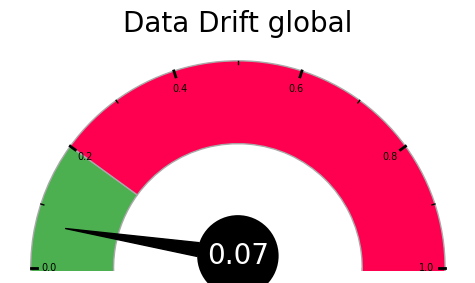

In [57]:
from IPython.display import display, HTML

html_table = styled_df.to_html()

# Bandeau d'alerte
if global_drift_score > 0.2:
    alert_message = f"🚨 ALERTE : dérive significative sur les features importantes. (Score global de dérive = {global_drift_score:.3f})"
    alert_color = "#ff5c5c"  # rouge vif
else:
    alert_message = f"✅ Aucune dérive critique détectée. (Score global de dérive = {global_drift_score:.3f})"
    alert_color = "#66cc66"  # vert doux

# HTML du bandeau stylisé
alert_html = f"""
<div style="
    background-color: white;
    border: 3px solid {alert_color};
    color: black;
    padding: 12px;
    text-align: center;
    font-weight: bold;
    border-radius: 8px;
    margin-bottom: 10px;
    font-size: 16px;
">
    {alert_message}
</div>
"""

# Titre du tableau
title_html = """
<div style="text-align: center; font-size: 20px; font-weight: bold; margin-bottom: 10px;">
    Features à surveiller
</div>
"""


# Conteneur global pour aligner la largeur
html_output = f"""
<div style="display: inline-block; text-align: left;">
    {gauge_html}
    {alert_html}
    {title_html}
    {html_table}
</div>
"""

display(HTML(html_output))